## Exercise:
* Modify the size and parameters of the 1D structural heterogeneity
* Play with order of scheme, CFL limit (eps), and dominant frequency of source wavelet
* How would you check your solution is accurate?


## Basic Equations

The numerical description of 1D-elastic waves propagating in a heterogeneous media is a natural extension of the homogeneous case. From an algorithmic point of view, now we allow both mass, and stiffness matrices to be initialized separately for each element. In contrast with the homogeneous case, elastic parameters $\lambda$ and $\mu$ may vary at each collocation point.

From a theoretical point of view, we basically follow the same strategy developed in the homogeneous case. The numerical solution for the 1D elastic wave equation

\begin{equation}
\rho(x) \partial_t^2 u(x,t) = \partial_x (\mu(x) \partial_x u(x,t)) + f(x,t),
\end{equation}

using the spectral element method is done after a series of steps summarized as follow:

1) The wave equation is written into its weak form

2) Assume stress-free boundary condition after integration by parts

3) Approximate the wave field as a linear combination of some basis

\begin{equation}
u(x,t) \ \approx \ \overline{u}(x,t) \ = \ \sum_{i=1}^{n} u_i(t) \ \varphi_i(x)
\end{equation}

4) Use the same basis functions in $u(x, t)$ as test functions in the weak form, the so call Galerkin principle.

6) The continuous weak form is written as a system of linear equations by considering the approximated displacement field.

\begin{equation}
\mathbf{M}^T\partial_t^2 \mathbf{u} + \mathbf{K}^T\mathbf{u} = \mathbf{f}
\end{equation}

7) Time extrapolation with centered finite differences scheme

\begin{equation}
\mathbf{u}(t + dt) = dt^2 (\mathbf{M}^T)^{-1}[\mathbf{f} - \mathbf{K}^T\mathbf{u}] + 2\mathbf{u} - \mathbf{u}(t-dt).
\end{equation}

where $\mathbf{M}$ is known as the mass matrix, and $\mathbf{K}$ the stiffness matrix.

The above solution is exactly the same presented for the classic finite-element method. Now we introduce appropriated basis functions and integration scheme to efficiently solve the system of matrices.

#### Interpolation with Lagrange Polynomials
At the elemental level (see section 7.4), we introduce as interpolating functions the Lagrange polynomials and use $\xi$ as the space variable representing our elemental domain:

\begin{equation}
\varphi_i \ \rightarrow \ \ell_i^{(N)} (\xi) \ := \ \prod_{j \neq i}^{N+1} \frac{\xi - \xi_j}{\xi_i-\xi_j}, \qquad   i,j = 1, 2, \dotsc , N + 1  
\end{equation}

#### Numerical Integration
The integral of a continuous function $f(x)$ can be calculated after replacing $f(x)$ by a polynomial approximation that can be integrated analytically. As interpolating functions we use again the Lagrange polynomials and
obtain Gauss-Lobatto-Legendre quadrature. Here, the GLL points are used to perform the integral.

\begin{equation}
\int_{-1}^1 f(x) \ dx \approx \int _{-1}^1 P_N(x) dx = \sum_{i=1}^{N+1}
 w_i f(x_i)
\end{equation}


In [30]:
# Import all necessary libraries, this is a configuration step for the exercise.
# Please run it before the simulation code!

import numpy as np
import matplotlib.pyplot as plt
import time # Used for cleaner animation pause

In [31]:
# ==============================================================================
# I. HELPER FUNCTIONS (RICKER, GLE, LEGENDRE, LAGRANGE)
# ==============================================================================

# --- RICKER WAVELET FUNCTION ---
def ricker(f, t, t0=0.0):
    """
    Create Ricker wavelet.
    f: Central frequency of the wavelet in Hz
    t: Time base definition (numpy array or scalar)
    t0: Offset time (time shift)
    """
    fact = (np.pi**2) * (f**2) * ((t - t0)**2)
    y = (1.0 - 2.0 * fact) * np.exp(-fact)
    return y

# --- LEGENDRE POLYNOMIAL ---
def legendre(N, x):
    """
    Returns the value of Legendre Polynomial P_N(x) at position x[-1, 1].
    """
    P = np.zeros(N + 1)

    if N == 0:
        P[0] = 1.0
    elif N == 1:
        P[1] = x
    else:
        P[0] = 1.0
        P[1] = x
        for i in range(2, N + 1):
            # Recurrence relation
            P[i] = (1.0 / float(i)) * ((2 * i - 1) * x * P[i - 1] - (i - 1) *
                                       P[i - 2])

    return P[N]

# --- GLL POINTS & WEIGHTS ---
def gll(N):
    """
    Returns GLL (Gauss Lobato Legendre) collocation points (xi) and weights (weights).
    Hardcoded values for N=2 to N=5 are used.
    """
    if N == 2:
        xi = np.array([-1.0, 0.0, 1.0])
        weights = np.array([0.33333333, 1.33333333, 0.33333333])
    elif N == 3:
        xi = np.array([-1.0, -0.447213595499957, 0.447213595499957, 1.0])
        weights = np.array([0.1666666667, 0.833333333, 0.833333333, 0.1666666666])
    elif N == 4:
        xi = np.array([-1.0, -0.6546536707079772, 0.0, 0.6546536707079772, 1.0])
        weights = np.array([0.1, 0.544444444, 0.711111111, 0.544444444, 0.1])
    elif N == 5:
        xi = np.array([-1.0, -0.7650553239294647, -0.2852315164806451,
                       0.2852315164806451, 0.7650553239294647, 1.0])
        weights = np.array([0.0666666667, 0.3784749503, 0.5548583833,
                            0.5548583833, 0.3784749503, 0.0666666667])
    else:
         # Use N=4 default if not hardcoded (for simplicity in a combined script)
         xi = np.array([-1.0, -0.6546536707079772, 0.0, 0.6546536707079772, 1.0])
         weights = np.array([0.1, 0.544444444, 0.711111111, 0.544444444, 0.1])
         print(f"Warning: GLL points for N={N} not hardcoded. Using N=4 default.")

    return xi, weights

# --- LAGRANGE POLYNOMIAL ---
def lagrange(N, i, x):
    """
    Function to calculate Lagrange polynomial l_i(x) for order N and polynomial
    i [0, N] at location x using GLL points.
    """
    xi, weights = gll(N)
    fac = 1
    # Loop over j = 0 to N (N+1 points)
    for j in range(0, N + 1):
        if j != i:
            fac = fac * ((x - xi[j]) / (xi[i] - xi[j]))
    return fac

# --- LAGRANGE POLYNOMIAL FOR ARBITRARY POINTS ---
def lagrange2(N, i, x, xi_in):
    """
    Program to calculate Lagrange polynomial for order N
    and polynomial i [0, N] at location x at given collacation points xi
    """
    fac = 1
    # Loop over j = 0 to N (N+1 points)
    for j in range(0, N + 1):
        if j != i:
            fac = fac * ((x - xi_in[j]) / (xi_in[i] - xi_in[j]))
    return fac

# --- 1ST DERIVATIVES OF LAGRANGE POLYNOMIALS (CORRECTED) ---
def lagrange1st(N):
    """
    Calculation of 1st derivatives of Lagrange polynomials
    at GLL collocation points (the differentiation matrix D).
    D[i, j] = l'_j(xi_i)

    FIXED: Implements the full, correct GLL differentiation matrix formula.
    """
    NG = N + 1
    D = np.zeros([NG, NG])

    xi, w = gll(N)

    for i in range(NG): # Row index (evaluation point)
        for j in range(NG): # Column index (polynomial index)
            if i != j:
                # Off-diagonal terms D_ij
                # D_ij = P_N(xi) / (P_N(xj) * (xi - xj))
                D[i, j] = legendre(N, xi[i]) / (legendre(N, xi[j]) * (xi[i] - xi[j]))
            else: # i == j (Diagonal terms D_ii)
                if xi[i] == -1.0: # Left boundary (i=0)
                    D[i, j] = -0.25 * N * (N + 1)
                elif xi[i] == 1.0: # Right boundary (i=N)
                    D[i, j] = 0.25 * N * (N + 1)
                else: # Internal points (0 < i < N)
                    # D_ii = xi / (1 - xi^2)
                    D[i, j] = xi[i] / (1.0 - xi[i]**2)

    return D

### 1. Initialization of setup

In [32]:
# ==============================================================================
# II. SIMULATION SETUP
# ==============================================================================

# 1. Initialization of setup
# ---------------------------------------------------------------
nt    = 7500            # number of time steps
xmax  = 8000.           # Length of domain [m]
N     = 3               # Order of Lagrange polynomials
ne    = 150             # Number of elements
Tdom  = .4              # Dominant period of Ricker source wavelet
f0    = 1.0 / Tdom      # Dominant frequency
iplot = 30              # Plotting each iplot snapshot
vs_bg = 2500.           # Background S velocity [m/s]
rho_bg = 2000.          # Background Density [kg/m^3]

# ----------------------------------------------------------------
# Initialization of GLL points integration weights
xi, w = gll(N)
NG = N + 1 # Number of GLL points per element

# Space domain
le = xmax / ne          # Length of elements
J = le / 2              # Jacobian
Ji = 1.0 / J            # Inverse Jacobian

# Global coordinates of GLL points
ng = ne * N + 1
xg = np.zeros(ng)

# Global coordinates assembly
for e in range(ne):
    x_start = e * le
    h_e = le
    for i in range(NG):
        xg[e * N + i] = x_start + 0.5 * h_e * (xi[i] + 1.0)

# 1st derivative of Lagrange polynomials (the Differentiation Matrix)
l1d = lagrange1st(N)

### 2. Low velocity zone
The introduction of an specific velocity model is done after allowing space-dependent elastic parameters. i.e.

\begin{equation}
\mu(x) = \rho(x) v_s(x)
\end{equation}

The following python code introduces a low-velocity zone (-40%) at the center of the model spanning 50 elements and visualizes the model. There is the possibility to try different velocity and density models by defining new python methods.

In [33]:
# 2. Low velocity zone (Model definition)
# ----------------------------------------------------------------
el_span = 25
percent = 0.4 # velocity reduction percentage
b_el = ne // 2 # Center element index

# Calculate the start/end indices for the anomaly based on element span
start_el = b_el - el_span // 2
end_el = b_el + el_span // 2
start_idx = start_el * N
end_idx = end_el * N + 1

vs = vs_bg * np.ones(ng)
rho = rho_bg * np.ones(ng)

# Apply the velocity reduction
vs[start_idx:end_idx] = vs_bg * percent

# Shear modulus mu = rho * vs^2
mu = rho * vs**2

c_max = np.max(vs)
dxmin = np.min(np.diff(xg))
eps = 0.5              # Courant value (using 0.5 for stability, original 0.1 is very safe)
dt = eps * dxmin / c_max    # Global time step
nt = int(7500 * (dt / (eps*dxmin/vs_bg))) # Adjust nt based on corrected dt to keep tmax ~ constant

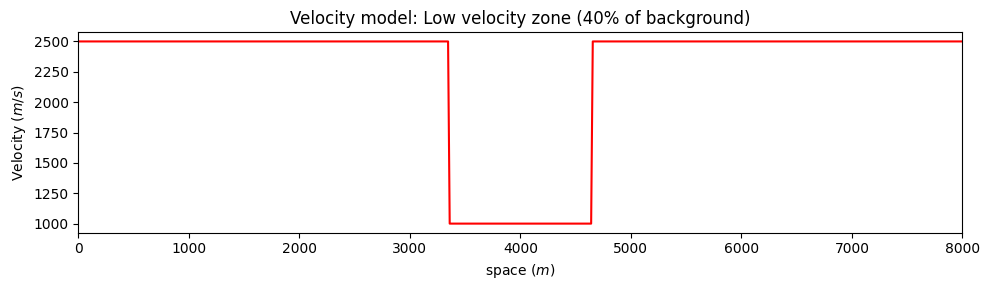

In [34]:
%matplotlib inline

# Plot velocity model
plt.figure(figsize=(10, 3))
plt.plot(xg, vs, 'r-', lw=1.5)
plt.title('Velocity model: Low velocity zone ({}% of background)'.format(int(percent * 100)))
plt.ylabel('Velocity $(m/s)$')
plt.xlabel('space $(m)$')
plt.xlim((0, xmax))
plt.tight_layout()
plt.show()

### 3. The Mass Matrix
Now we initialize the mass and stiffness matrices. In general, the mass matrix at the elemental level is given

\begin{equation}
M_{ji}^e \ = \ w_j  \ \rho (\xi)  \ \frac{\mathrm{d}x}{\mathrm{d}\xi} \delta_{ij} \vert_ {\xi = \xi_j}
\end{equation}


We implement the mass matrix at each element using the integration weights at GLL locations $w$, the Jacobian $J$, and density $\rho$. Then, perform the global assembly of the mass matrix, compute its inverse, and display the inverse mass matrix to visually inspect how it looks like.

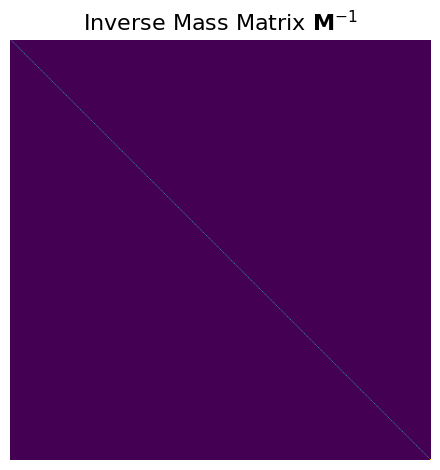

In [35]:
# CODE CELL 1: Place this at the very beginning of your plotting section
# The %matplotlib inline command is typically run once.
# It tells the notebook to render plots as static images right below the code cell.
%matplotlib inline

# Now, we continue with the Mass Matrix calculation and plotting
# Remember: ng, N, rho, w, and J must be defined in earlier cells!

# 3. Global Mass Matrix (M) Assembly (Diagonal)
# ---------------------------------------------------------------
NG = N + 1
M_diag = np.zeros(ng)

for e in range(ne):
    idx = np.arange(e * N, e * N + NG)
    rho_e = rho[idx]
    J_e = J
    Me_diag = rho_e * w * J_e
    M_diag[idx] += Me_diag

# Inverse Mass Matrix
Minv = np.diag(1.0 / M_diag)

# Display inverse mass matrix inv(M)
plt.figure()
plt.imshow(Minv, cmap='viridis')
# Note the 'r' for raw string to fix the SyntaxWarning!
plt.title(r'Inverse Mass Matrix $\mathbf{M}^{-1}$', size=16)
plt.axis("off")
plt.tight_layout()
plt.show() # This command actually renders the plot

### 4. The Stiffness matrix
On the other hand, the general form of the stiffness matrix at the elemental level is

\begin{equation}
K_{ji}^e \ = \ \sum_{k = 1}^{N+1} w_k \mu (\xi) \partial_\xi \ell_j (\xi) \partial_\xi \ell_i (\xi) \left(\frac{\mathrm{d}\xi}{\mathrm{d}x} \right)^2 \frac{\mathrm{d}x}{\mathrm{d}\xi} \vert_{\xi = \xi_k}
\end{equation}

Implementing, now, for the stiffness matrix at each element using the integration weights at GLL locations $w$, the Jacobian $J$, and shear stress $\mu$. Then, perform the global assembly of the mass matrix and display the matrix.

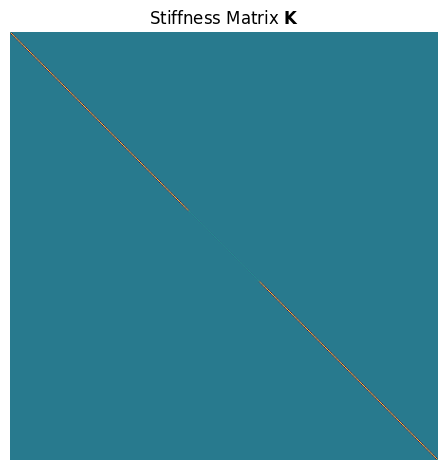

In [36]:
%matplotlib inline

# 4. Global Stiffness Matrix (K) Assembly
# ---------------------------------------------------------------
K = np.zeros([ng, ng])

for e in range(ne):
    # Global indices for element e
    idx = np.arange(e * N, e * N + NG)

    # Local parameters
    mu_e = mu[idx]
    J_e = J
    Ji_e = Ji

    # Initialize elemental stiffness matrix
    Ke = np.zeros((NG, NG))

    # Assembly in the reference element
    # K_ij = sum_k [ w_k * mu_k * D_ki * D_kj * (1/J) ]
    for i in range(NG):
        for j in range(NG):
            sum_val = 0.0
            for k in range(NG):
                sum_val += mu_e[k] * w[k] * Ji_e * l1d[k, i] * l1d[k, j]
            Ke[i, j] = sum_val

    # Global Assembly (Ke is added to the block K[idx, idx])
    K[np.ix_(idx, idx)] += Ke

# Display stiffness matrix K
plt.figure()
plt.imshow(K, cmap='viridis')
plt.title(r'Stiffness Matrix $\mathbf{K}$')
plt.axis("off")
plt.tight_layout()
plt.show()

### 5. Finite element solution

Finally we implement the spectral element solution using the computed mass $M$ and stiffness $K$ matrices together with a finite differences extrapolation scheme

\begin{equation}
\mathbf{u}(t + dt) = dt^2 (\mathbf{M}^T)^{-1}[\mathbf{f} - \mathbf{K}^T\mathbf{u}] + 2\mathbf{u} - \mathbf{u}(t-dt).
\end{equation}

In [42]:
# --- Required Imports for FuncAnimation in Colab ---
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# 5. Finite element solution (Time extrapolation)
# ---------------------------------------------------------------
# initialize source time function and force vector f
t_ricker = np.arange(nt) * dt
src = ricker(f0, t_ricker, t0=1.0/f0)
isrc = ng // 2  # Source location (center of the domain)

# Initialization of solution vectors (must be global for the update function)
# We use global scope for these mutable arrays to be easily accessed by FuncAnimation
u = np.zeros(ng)
uold = np.copy(u)
f = np.zeros(ng)

# --------------------------------------------------------------
# Initialize animated plot figure and axes
# --------------------------------------------------------------
fig, ax = plt.subplots(figsize=(10, 6))

# Plotting low velocity zone for reference
half = xmax / 2
el_span_dist = el_span * le / 2 # Half distance of the low velocity zone
ax.axvspan(half - el_span_dist,
           half + el_span_dist,
           alpha=0.2, facecolor='b', label='Low Velocity Zone')

# Estimate max amplitude for a reasonable y-limit
# This is a heuristic guess, may need manual adjustment for extreme cases.
max_amp_guess = dt**2 * np.max(np.abs(src)) * np.max(1.0 / M_diag) * 20
ax.set_ylim(-max_amp_guess/20, max_amp_guess/20)
ax.set_xlim(0, xmax)
ax.set_xlabel(' x (m)', size=12)
ax.set_ylabel(' Displacement ', size=12)
ax.set_title(r'SEM 1D Wave Propagation in Heterogeneous Medium', size=14)
ax.legend(loc='upper right')
ax.grid(True)

# Create the line object that will be updated
line, = ax.plot(xg, u, color="black", lw=1.5)

# ---------------------------------------------------------------
# Animation Function (performs one time step of SEM)
# ---------------------------------------------------------------
def update_sem(it):
    # Use global variables for the solution vectors (required since we modify them)
    global u, uold, f

    # 1. Source initialization
    f[:] = 0.0 # Reset force vector
    if it < len(src):
        f[isrc] = src[it]

    # 2. Time extrapolation: u_new = dt^2 * Minv @ (f - K @ u) + 2*u - u_old
    unew = dt**2 * Minv @ (f - K @ u) + 2 * u - uold

    # 3. Update solution vectors (use slice assignment to modify globals in place)
    uold[:] = u[:]
    u[:] = unew[:]

    # 4. Update plot line and title
    line.set_ydata(u)
    ax.set_title(f'SEM 1D Wave Propagation (Time: {it * dt:.4f} s / Total: {nt * dt:.2f} s)')

    return line, # FuncAnimation requires a tuple of updated artists

# ---------------------------------------------------------------
# Run and Display Animation
# ---------------------------------------------------------------
# Use frames that are multiples of iplot (e.g., 30) for faster rendering
frames_to_animate = np.arange(0, nt, iplot)

print(f"Starting animation rendering. Total frames to render: {len(frames_to_animate)}.")
ani = FuncAnimation(fig,
                    update_sem,
                    frames=frames_to_animate,
                    interval=50, # Time delay between frames in ms
                    blit=True)

# Display animation in Colab/Jupyter notebook
plt.close(fig) # Close the static figure view
HTML(ani.to_jshtml())

Starting animation rendering. Total frames to render: 250.
